[![PyPI](https://img.shields.io/badge/PyPI-stratapy-FCB001?logo=pypi)](https://pypi.org/project/stratapy/)
[![DOI](https://img.shields.io/badge/DOI-10.5281%2Fzenodo.19320013-blue)](https://doi.org/10.5281/zenodo.19320013)
[![Docs](https://img.shields.io/badge/ReadTheDocs-latest-8ca1af?logo=readthedocs)](https://stratapy.readthedocs.io/en/latest/?badge=latest)
[![Open In
Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/Jack6228/stratapy/blob/master/examples/ManuscriptFigures.ipynb)

**Introduction**

This notebook provides the code to replicate the figures from 'stratapy: A Tool for Automated Stratigraphic Log Visualisation' (Smith et al., 2026). 

All of the files used to create these figures are available in stratapy by default.

This notebook can be accessed and run through Google Colab without installing Python or stratapy:

[![Open in Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/Jack6228/stratapy/blob/main/examples/ManuscriptFigures.ipynb)

In [ ]:
# Ensure stratapy is installed 
!pip install stratapy

In [ ]:
# Import stratapy
import stratapy as sp
sp.__version__

Figure 1 is not recreated here explicitly, but the code to create the constituent logs is either that of later figures, or are available in stratapy's documentation/gallery:

[![Docs](https://img.shields.io/badge/ReadTheDocs-latest-blue?logo=readthedocs)](https://stratapy.readthedocs.io/en/latest/?badge=latest)

**Figure 2**

A simple stratigraphic log. This uses the 'tutorial' file, which is provided by default with stratapy. These files can be accessed using `sp.load('examples.XXX.csv')` and are also available on GitHub.

Using stratapy example log: tutorial.csv


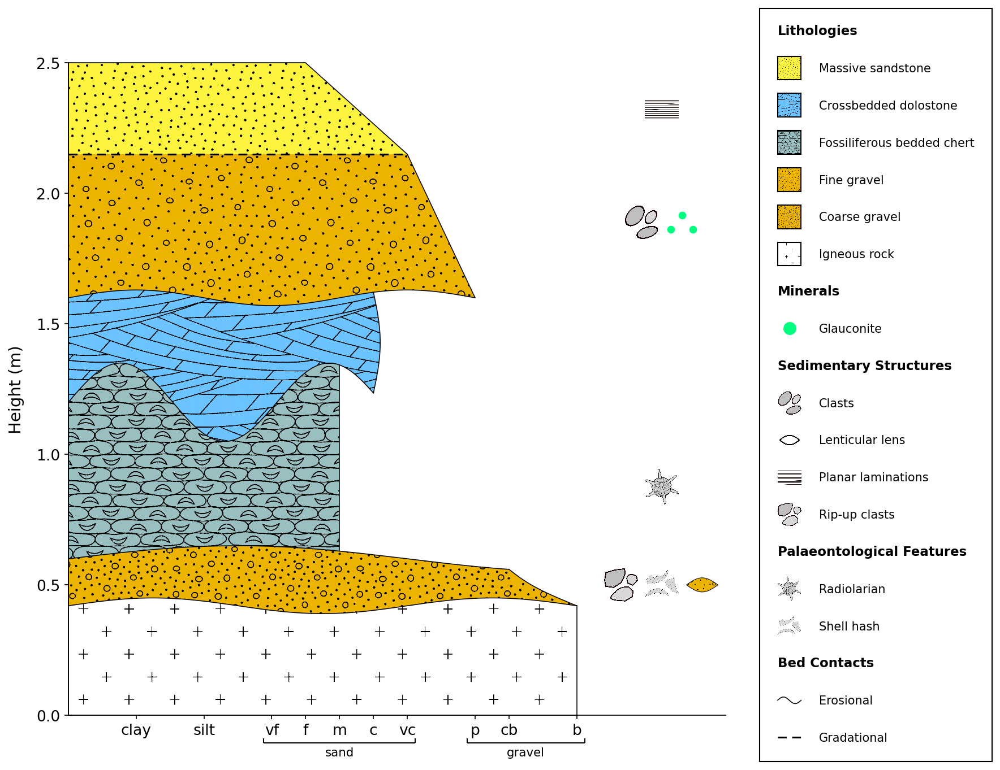

In [3]:
# Load the file
log = sp.load('examples.tutorial.csv')
# Plot the log
log.plot()
# We can uncomment the following line to save the figure
# log.save('Figure2.png')

To increase the quality and adjust the aspect ratio to that shown in the paper, we configure some of the optional parameters.

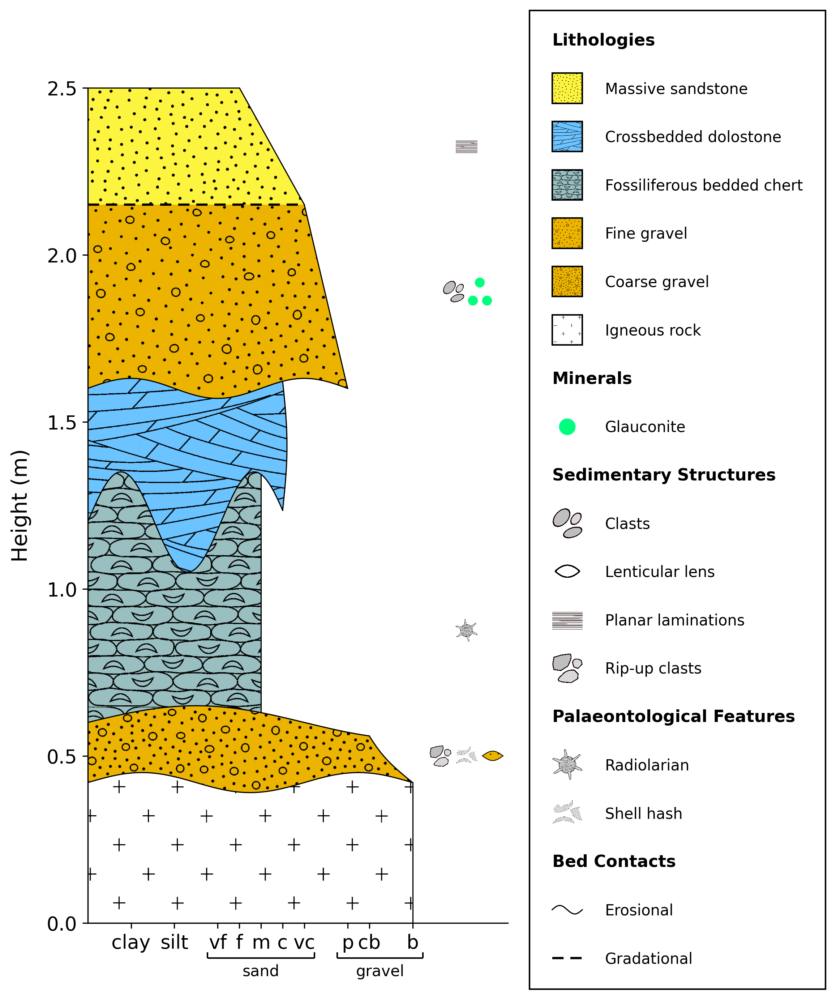

In [4]:
log.plot(figsize=(5, 10), dpi=300)
# # log.save('Figure2.png')

**Figure 3**

These figures show the same log as Figure 2, but with different styling.

Using stratapy example log: tutorial.csv


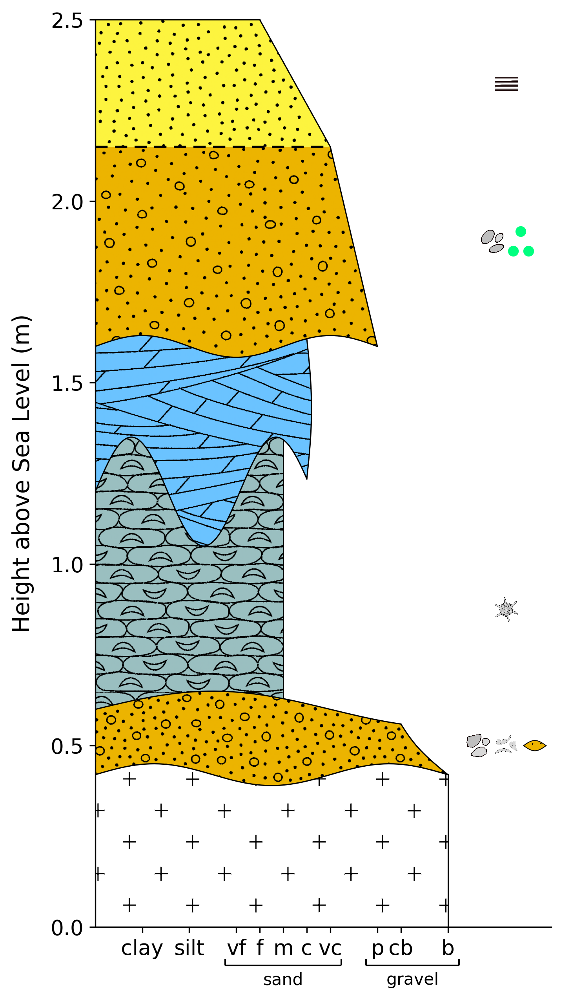

In [5]:
log = sp.load('examples.tutorial.csv')
log.plot(figsize=(5, 10), legend=False, y_label='Height above Sea Level', dpi=300)
# # log.save('Figure3a', transparent=True)

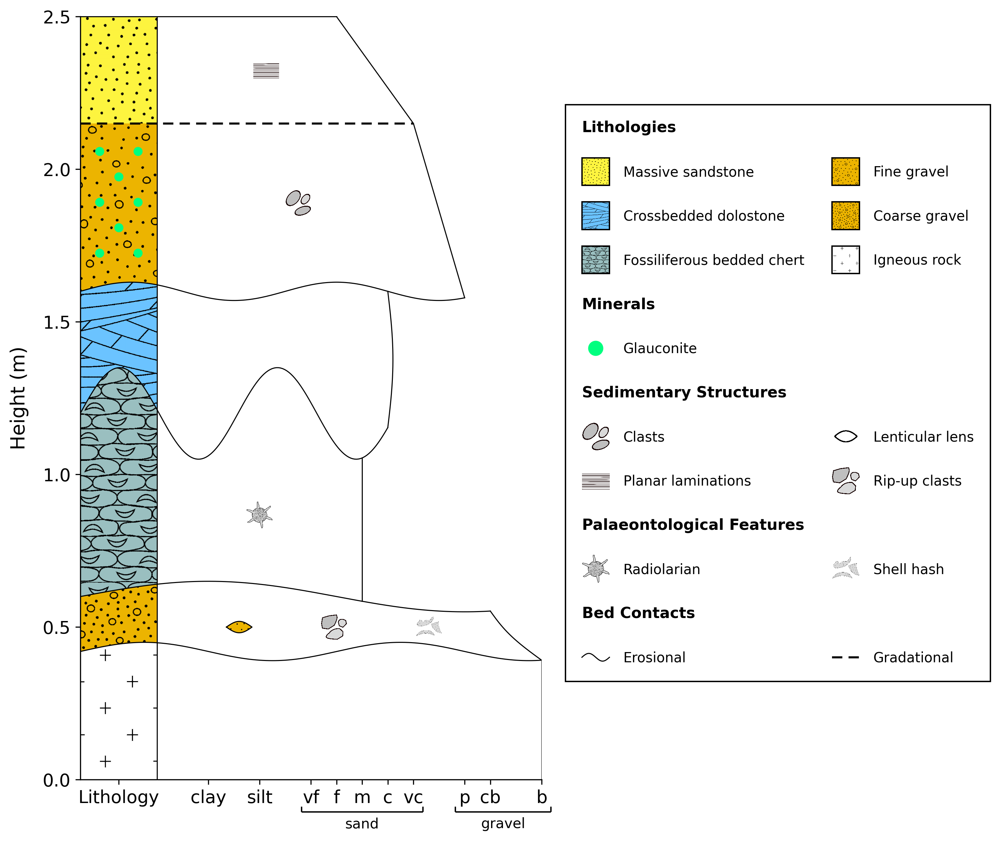

In [6]:
log.plot(figsize=(6, 10), display_mode='grainsize', legend_columns=2, feature_mode='merge', dpi=300)
# # log.save('Figure3b', transparent=True)

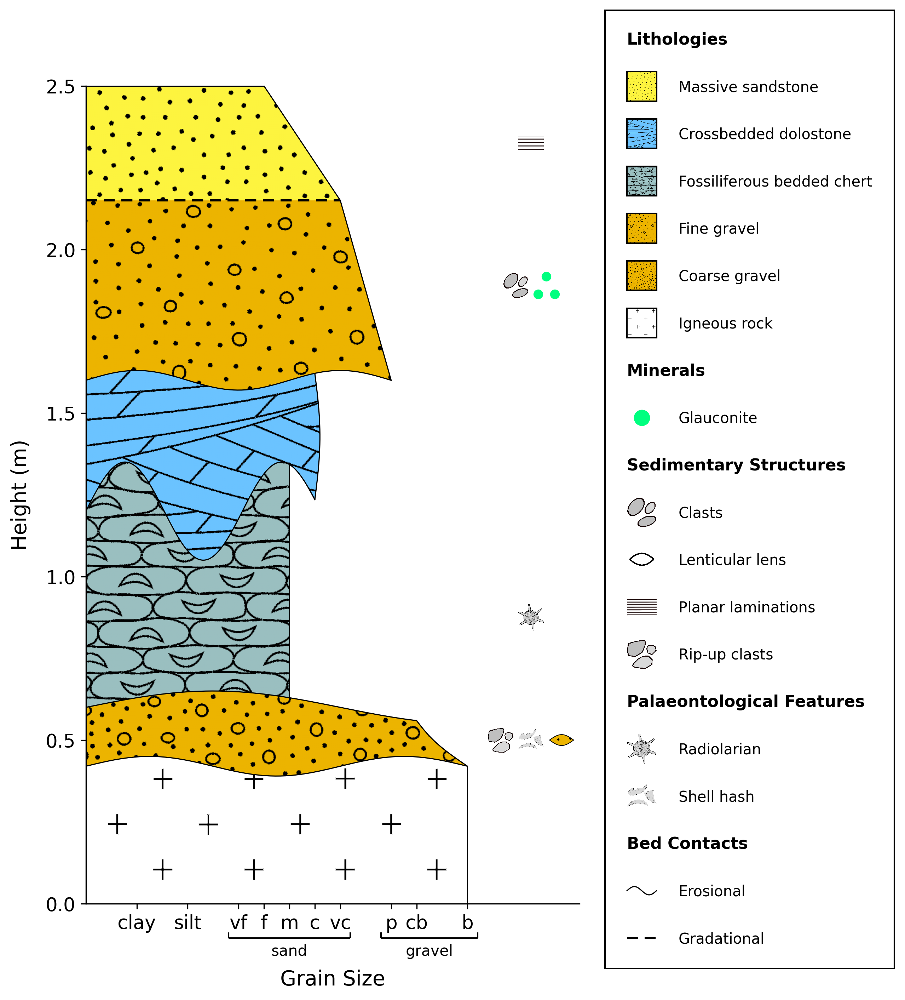

In [7]:
log.plot(figsize=(6, 10), ppi=250, x_label='Grain Size', feature_size=1, dpi=300)
# # log.save('Figure3c', transparent=True)

**Figure 4**

This figure uses data from Southern Cyprus [[1]](#References) to show the depositional history and incorporates customised lithological patterns, colours, and names.

In [8]:
# Update the lithologies 
sp.update_lithologies( {
        'ophiolite': ('721', 'dimgray', 'Troodos ophiolite'),
        'bioclastic': ('702', '#FBF4DB', 'Bioclastic calcarenites and marls'),
        'evaporites': ('724', "#9899CD", 'Evaporites'),
        'shallow': ('dolostone', "#B8E5FA", 'Shelf carbonates'),
        'shallowandreef': ('627', "#B8E5FA", 'Shelf carbonates'),
        'marly': ('clay', "#6597CE", 'Marly chalk'),
        'pelagicchalk': ('638', "#6597CE", 'Pelagic chalk'),
        'pelagicchert': ('639', "#6597CE", 'Pelagic chalk and chert'),
        'marls': ('clay', "#CFC0AC", 'Marls'),
        'reefs': ('629', "#2DB772", 'Reefs'),
        'sandstone': ('681', "#B5543E", 'Sandstones'),
} )

Lithologies added for use: 'ophiolite', 'bioclastic', 'evaporites', 'shallow', 'shallowandreef', 'marly', 'pelagicchalk', 'pelagicchert', 'marls', 'reefs', 'sandstone'


Using stratapy example log: Papadimitriou_2018.csv


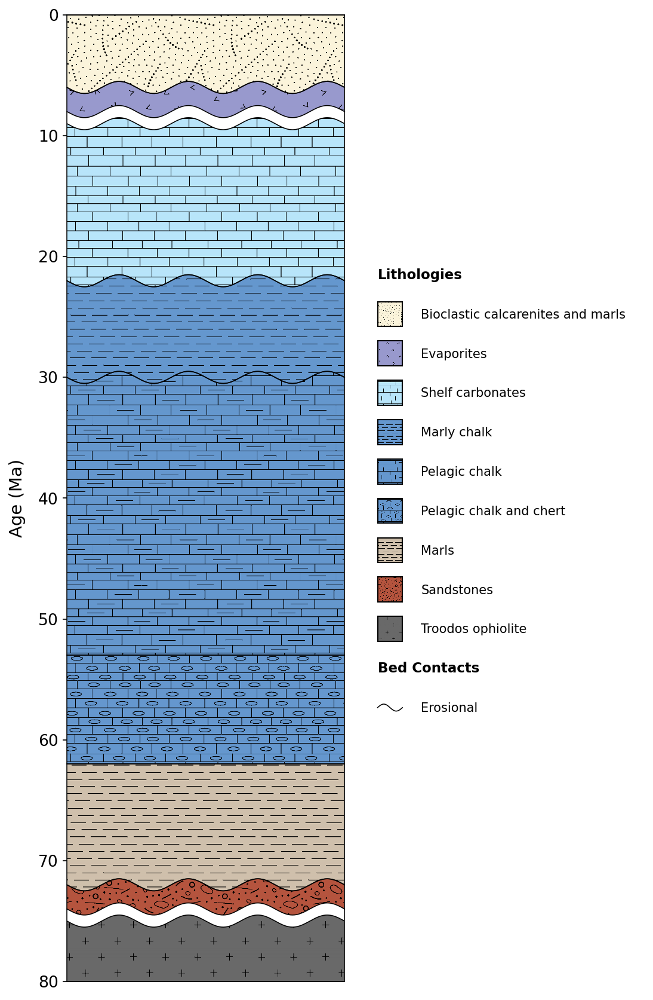

In [9]:
log = sp.load('examples.Papadimitriou_2018.csv')
log.plot(ppi=600, display_mode='log', figsize=(4, 14), dpi=150, legend_border=False)
# log.save('Figure4.png', transparent=True)

**Figure 5**

We use three logs from Messinian, Pliocene, and Pleistocene sequences encompassed in Figure 4 [[2-4]](#References) to demonstrate the ability to plot multiple logs together with ``multi_fig``.

We use custom lithologies and add a new feature for Scaphopods, based on the default Trace Fossil feature.

Note that we use the ``panel`` variable instead of the prior ``log`` to indicate that we are plotting multiple logs together.

In [10]:
sp.update_features({
    'scaphopod': ('', 'trace fossil', 'Scaphopods'),
})
sp.update_lithologies( {
    'conglomerate': ('coarse gravel', '', 'Conglomerate'),
    'marl': ('flint clay', '', 'Marl'),
    'crossbedded limestone': ('crossbedded limestone', '', 'Crossbedded grainstone'),
    'aeolianite': ('crossbedded sandstone', '', 'Aeolianite'),
    'limestone': ('limestone', '', 'Grainstone'),
    'packstone': ('629', '', 'Packstone'),
})

Features updated: scaphopod
Lithologies added for use: 'conglomerate', 'marl', 'crossbedded limestone', 'aeolianite', 'limestone', 'packstone'


Created new figure with 1 rows and 3 columns for 3 files.
Using stratapy example log: Palamakumbura_2018.csv
Using stratapy example log: Balmer_2019.csv
Using stratapy example log: Antoniou_2025.csv


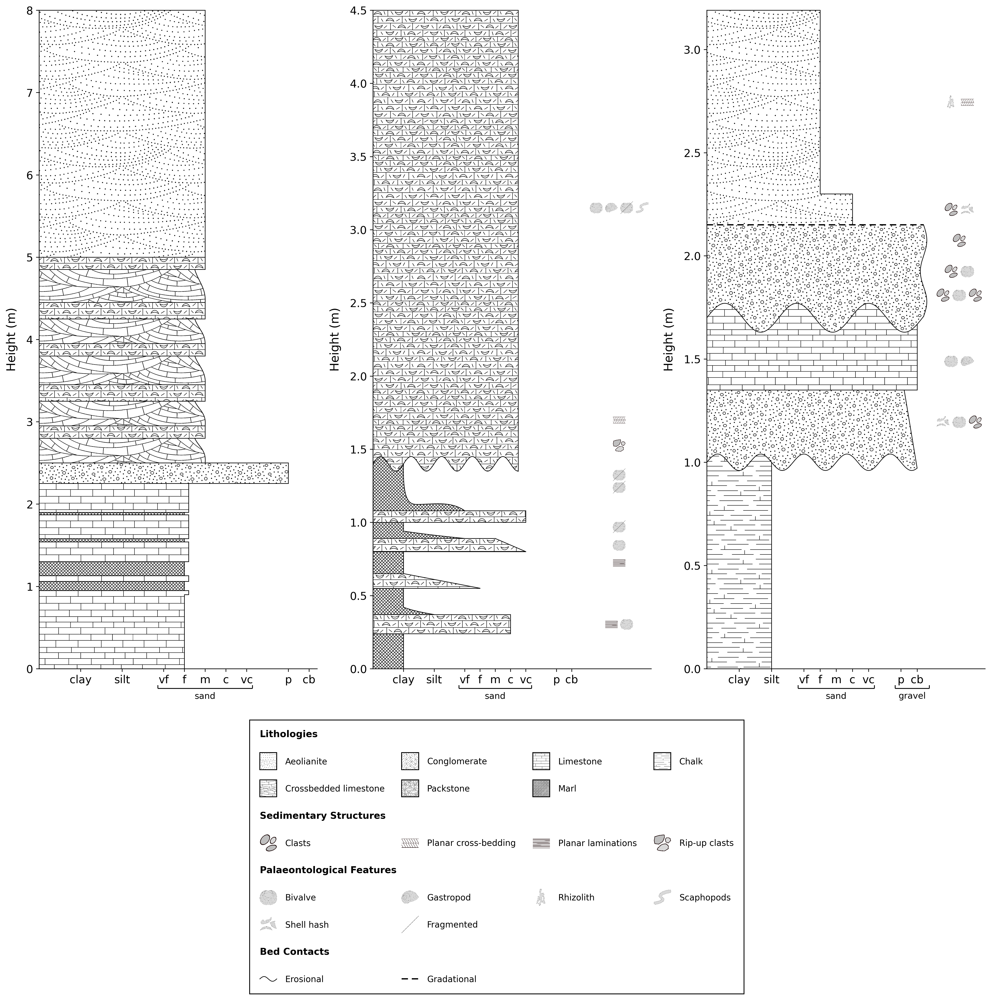

In [11]:
# Create a list of files to plot
files = ['examples.Palamakumbura_2018.csv', 'examples.Balmer_2019.csv', 'examples.Antoniou_2025.csv']

# Use multi_fig to plot the three logs together
panel = sp.multi_fig(files, nrows=1, ncols=3, figsize=(20, 14), dpi=300, ppi=600, legend_loc='bottom', legend_columns=4, feature_size=.8, sharex=True)

# Use the MultiLogObject's .save() method to save the entire panel as a single image
# panel.save('Figure5.png', transparent=True)

**Figure 6**

To add data and observations to a log, stratapy integrates with Matplotlib. This figure uses matplotlib to construct five subplots with geochemical and formation subdivisions [[5]](#References), adding a log with stratapy.

This log also utilises the ``log.add_samples`` method to add a formatted point to represent a radiometric age.

In [12]:
# We update some lithologies, features, and font sizes for better display.
sp.formatting.fontsizes['y_tick_labels'] = 10
sp.update_features( {
    'shell hash': ('structure', '', 'Skeletal Fossil')
} )
sp.update_lithologies( {
    'grainstone': ('627', '', 'Grainstone'),
    'laminite': ('675', '', 'Laminite-heterolithic'),
    'reef': ('630', '', 'Microbialite reef'),
} )

Features updated: shell hash
Lithologies added for use: 'grainstone', 'laminite', 'reef'


Since we use matplotlib, we have to import this package. Use ``!pip install matplotlib`` if this cell gives an error.

We also use pandas to read in the geochemical data.

In [13]:
# !pip install matplotlib
import matplotlib.pyplot as plt
# !pip install pandas
import pandas as pd

In [14]:
# Load the geochemical data
df = pd.read_csv('./Figure6Data.csv')

Using stratapy example log: Tostevin_2019.csv


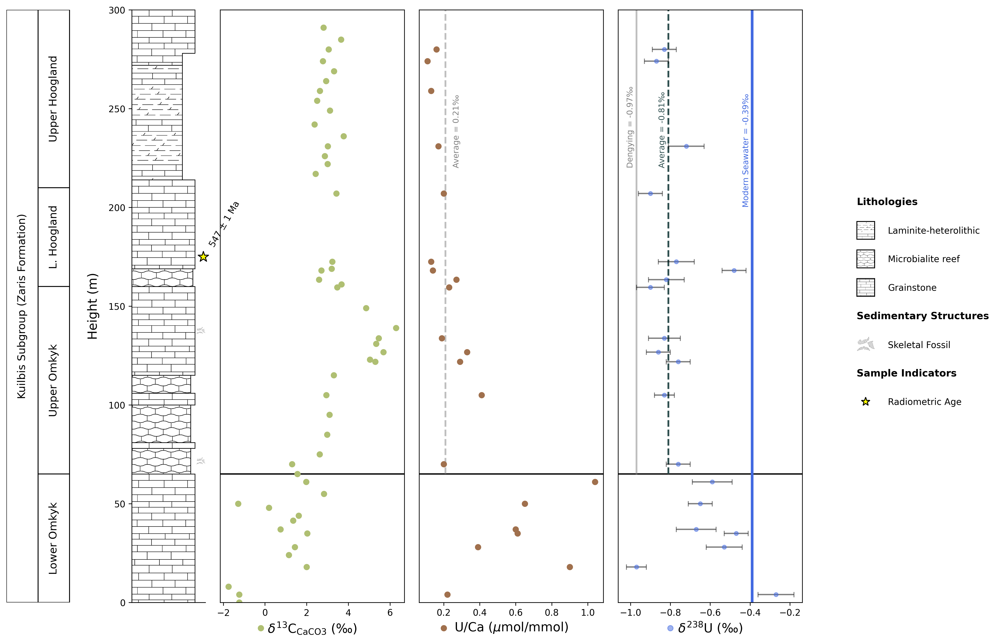

In [15]:
# Create a figure
fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(16, 12), gridspec_kw={'wspace': 0.1, 'width_ratios': [0.6, 0.4, 1, 1, 1]}, sharey=False)

# Add the stratapy log
log = sp.load('examples.Tostevin_2019.csv', grain_brackets={})
log.plot(fig, ax[1], ppi=600, legend_loc='right', legend_columns=1, feature_size=4, legend_border=False, dpi=300)
log.add_samples([175], label='Radiometric Age', x=17, scatter_kwargs={'color': 'yellow', 's': 150, 'marker': '*', 'zorder': 5, 'edgecolor': 'k', 'linewidth': 1})
log.ax.set_xticks([])

# Formation Annotations
ax[0].axis('off')
ax[0].add_patch(plt.Rectangle((0,0), 1, 300, facecolor='none', edgecolor='k'))
ax[0].add_patch(plt.Rectangle((1,0), 1, 65, facecolor='none', edgecolor='k'))
ax[0].add_patch(plt.Rectangle((1,65), 1, 95, facecolor='none', edgecolor='k'))
ax[0].add_patch(plt.Rectangle((1,160), 1, 50, facecolor='none', edgecolor='k'))
ax[0].add_patch(plt.Rectangle((1,210), 1, 90, facecolor='none', edgecolor='k'))
ax[0].text(0.5, 150, 'Kuilbis Subgroup (Zaris Formation)', ha='center', va='center', fontsize=12, rotation=90)
ax[0].text(1.5, 65/2, 'Lower Omkyk', ha='center', va='center', fontsize=12, rotation=90)
ax[0].text(1.5, 65+95/2, 'Upper Omkyk', ha='center', va='center', fontsize=12, rotation=90)
ax[0].text(1.5, 185, 'L. Hoogland', ha='center', va='center', fontsize=12, rotation=90)
ax[0].text(1.5, 255, 'Upper Hoogland', ha='center', va='center', fontsize=12, rotation=90)
ax[0].set_xlim(0, 3.5)

# Radiometric age annotation
fig.text(18, 179, r'547 $\pm$ 1 Ma', ha='left', va='bottom', fontsize=10, rotation=60, clip_on=False, zorder=100, transform=ax[1].transData)

# Carbon 13 Data
ax[2].scatter(df['d13C'], df['Height_m'], color='#AFBF72')
ax[2].set_xlabel(r'$\delta^{13}$C$_\text{CaCO3}$ (‰)', fontsize=14)
ax[2].yaxis.set_visible(False)
ax[2].scatter(-.2, -13, c='#AFBF72', clip_on=False)

# U/Ca Data
ax[3].set_xlabel(r'U/Ca ($\mu$mol/mmol)', fontsize=14)
ax[3].scatter(df['U/Ca'], df['Height_m'], c='#A0704D')
ax[3].yaxis.set_visible(False)
ax[3].scatter(0.2, -13, c='#A0704D', clip_on=False)

# U238 Data
ax[4].errorbar(df['d238U'], df['Height_m'], xerr=df['U_err'], fmt='none', ecolor='black', alpha=0.5, zorder=1, capsize=3)
ax[4].scatter(df['d238U'], df['Height_m'], color='royalblue', s=20, zorder=2, alpha=0.5)
ax[4].set_xlabel(r'$\delta^{238}$U (‰)', fontsize=14)
ax[4].yaxis.set_visible(False)
ax[4].scatter(-.8, -13, c='royalblue', alpha=0.5, clip_on=False)

# Annotations
[a.axhline(65, c='k', ls='-', alpha=1, zorder=-1) for a in ax[2:]]
ax[3].plot([0.21, 0.21], [65, 300], c='grey', ls='--', lw=2, alpha=.5, zorder=-1)
ax[3].text(0.25, 220, 'Average = 0.21‰', ha='left', va='bottom', fontsize=9, rotation=90, color='grey', alpha=1)
[a.set_ylim(0, 300) for a in ax]
ax[4].text(-0.98, 220, 'Dengying = -0.97‰', ha='right', va='bottom', fontsize=9, rotation=90, color='grey', alpha=1)
ax[4].plot([-0.97, -0.97], [65, 300], c='grey', ls='-', lw=2, alpha=.5, zorder=-1)
ax[4].text(-0.82, 220, 'Average = -0.81‰', ha='right', va='bottom', fontsize=9, rotation=90, color='darkslategrey')
ax[4].plot([-0.81, -0.81], [65, 300], c='darkslategrey', ls='--', lw=2, alpha=1, zorder=-1)
ax[4].text(-0.4, 200, 'Modern Seawater = -0.39‰', ha='right', va='bottom', fontsize=9, rotation=90, color='royalblue')
ax[4].axvline(-0.39, c='royalblue', ls='-', lw=3, alpha=1, zorder=-1)

# We can save this figure using matplotlib's savefig
# fig.savefig('Figure6.png', transparent=True)

**Figure 7**

This figure plots many logs together using the ``correlated_logs`` function, using data from tephra falls in New Zealand [[6]](#References).

We also use ``log.add_labels`` to add labels to units in each log.

In [16]:
# Pre-define the labels and names of the logs, as well as provide new lithologies and set font sizes
sp.update_lithologies( {
    'white': ('', 'w', 'Empty'),
    'tephra': ('', 'navy', 'Tephra'),
    'break': ('', 'tan', 'Break'),
} )

log_names = ['83','79','75','64','67','71','95','111','103','98','107','121','125','131','132']
log_labels = [
    ['','68 Rw','','107 Ok','','164 KKT','','270 Hp','','283 Mk','','302 M4','','334 M3','','371 RW','','410 Re'],
    ['','31 M7','','46 Rm','','81 Wh','','187 RW\n','','191 M5','','\n199 Ok','','268 RW','','289 Tr','','330 KKT','','503 Hp','','523 Mk','','549 M4','','568 Ta','','651 Re'],
    ['','28 Rm','','148 Ok','','303 Hp','','317 Mk','','324 M4','','469 M3','','522 M2'],
    ['','7 A','','37 Wk','','48','','89 Rm','','125 M6','','153 Rw','','265 A','','293 M5','','307 Ok','','372 Tr','','630 KKT RW','','725 KKT','','774 O?','','839 Om','','893 Mn','','1021 Hp','','1054 Mk',''],
    ['','39 RW','','52 Wk','','75 Rm','','101 A','','187 M6','','360 Hp','','420 Mk','','440 RW','','469 RW','','488 RW','','529 RW','','538 RW','','590 RW','','635 RW',''],
    ['','115 RW','','187 RW','','217 RW','','262 RW','','277 Tr?','','361 RW\n','','367 RW','','391 RW','','402 RW','','429 RW','','477 RW','','505 RW',''],
    ['','28 Ma?','','209 RW','','297 RW'],
    ['','93 Ok','','130 KKT','','151 Mn','','230 Hp','','243 Mk','','305 RW','','331 Re','','351 X5','','431 X4','','533 X3','','','','1030 X2',''],
    ['','74 Wh','','138 Ck','','161 KKT?','','250 KKT','','264 RW','','','','593 Hp','','611 Mk','','616 M4','','631 Ta','','678 RW','','692 Re',''],
    ['','15 RW','','35 RW','','52 RW','','63 A','','73 RW','','110 RW','','197 A','','211 RW','','221 A','','275 RW','','310 RW','','354 RW',''],
    ['','105 Tp','','215 Wk','','334 Ma','','439 Rm',''],
    ['','133 Ok','','179 M4','','241 Re',''],
    ['','163 Rw','','211 RW','','282 Ok','','346 KKT','','549 Hp','','571 Mk','','583 M4','','613 RW','','713 Re','','805 X5','','928 X4',''],
    ['','23 Rw','','154 KKT','','236 Hp','','253 Hp','','265 M4','','295 RW','','391 X5','','579 M1','','817 X2','','872 X1',''],
    ['','90 Hp','','103 Mk','','181 Re','']
]

sp.formatting.fontsizes.update( {
    'y_axis_label': 9,
    'y_tick_labels': 8,
} )

Lithologies added for use: 'white', 'tephra', 'break'


Using stratapy example log: tephra_83.csv
Using stratapy example log: tephra_79.csv
Using stratapy example log: tephra_75.csv
Using stratapy example log: tephra_64.csv
Using stratapy example log: tephra_67.csv
Using stratapy example log: tephra_71.csv
Using stratapy example log: tephra_95.csv
Using stratapy example log: tephra_111.csv
Using stratapy example log: tephra_103.csv
Using stratapy example log: tephra_98.csv
Using stratapy example log: tephra_107.csv
Using stratapy example log: tephra_121.csv
Using stratapy example log: tephra_125.csv
Using stratapy example log: tephra_131.csv
Using stratapy example log: tephra_132.csv


Text(0.15, 0.15, 'Tp = Taupo 1.8 ka\nWk = Whakatane 5.5 ka\nMa = Mamaku 8 ka\nRm = Rotoma 9.5 ka\nWh = Waiohau 13.7 ka\nRw = Rerewhakaaitu 17.8 ka\nOk = Okareka 22.6 ka\nTr = Te Rere 25.5 ka\nKKT = Oruanui (Kawkawa) 27.1 ka\nO = Okaia c. 30 ka\nOm = Omataroa c. 32 ka\nMn = Mangaone c. 33 ka\nHp = Hauparu c. 35 ka\nMk = Maketu c. 37 ka\nTa = Tahuna c. 39 ka\nRe = Rotoehu c. 50 ka\nX1-5 = pre-Re rhyolites\nM1-7 = Mayor Is\nA = Andesite\nRW = Reworked')

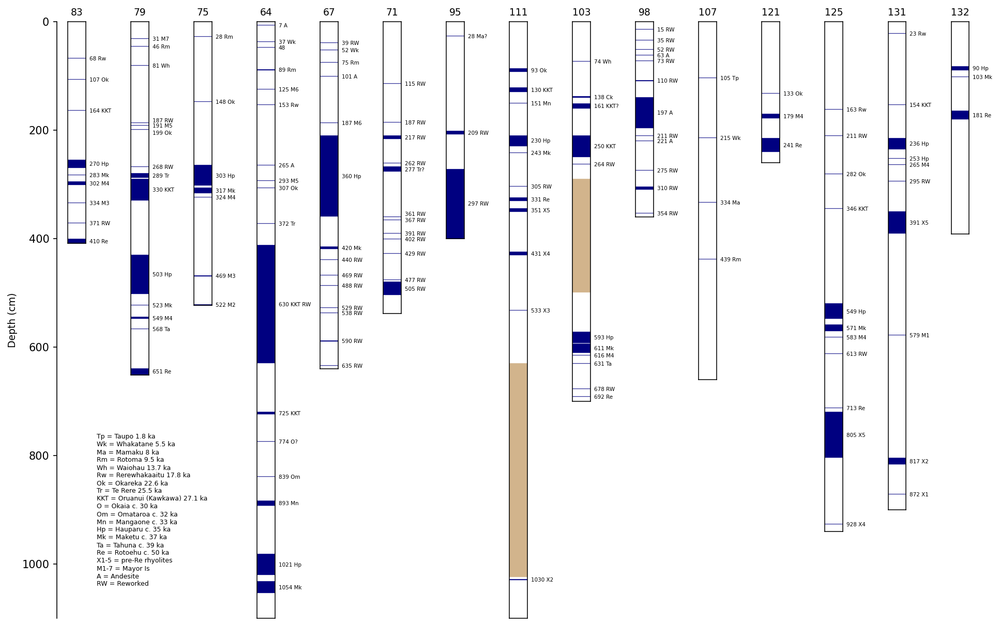

In [17]:
# Compile a list of the filenames
files = [f'examples.tephra_{f}.csv' for f in log_names]

# Plot correlated logs
panel = sp.correlated_logs(files, figsize=(len(files), 10), unit_borders=False, y_label='Depth', y_axis_unit='cm', spine_distance=10, fig_kwargs={'gridspec_kw': {'wspace': 2.5}}, legend=False)

# Add titles and labels to each log
for l, log in enumerate(panel.logs):
    # Add labels using stratapy's add_labels method
    log.add_labels(log_labels[l], fontsize=5, padding=20)
    log.ax.set_title(log_names[l], fontsize=9)

# Add a custom legend for the label abbreviations
txt = "Tp = Taupo 1.8 ka\nWk = Whakatane 5.5 ka\nMa = Mamaku 8 ka\nRm = Rotoma 9.5 ka\nWh = Waiohau 13.7 ka\nRw = Rerewhakaaitu 17.8 ka\nOk = Okareka 22.6 ka\nTr = Te Rere 25.5 ka\nKKT = Oruanui (Kawkawa) 27.1 ka\nO = Okaia c. 30 ka\nOm = Omataroa c. 32 ka\nMn = Mangaone c. 33 ka\nHp = Hauparu c. 35 ka\nMk = Maketu c. 37 ka\nTa = Tahuna c. 39 ka\nRe = Rotoehu c. 50 ka\nX1-5 = pre-Re rhyolites\nM1-7 = Mayor Is\nA = Andesite\nRW = Reworked"
# Use the matplotlib figure object to add text to the entire panel
panel.fig.text(0.15, 0.15, txt, fontsize=6, va='bottom', ha='left')

# panel.save('Figure7.png', transparent=True)

**Figure 8**

Here we use ``multi_fig`` to plot side-by-side borehole logs with custom formatting from the British Geological Survey's UK Geoenergy Observatories project [[7]](#References).

In [18]:
sp.update_lithologies( {
    'MadeGround': ('667', '', 'Made ground'),
    'CoalPillar': ('216', '', 'Coal pillar and void'),
    'PackedWaste': ('430', '', 'Packed waste'),
    'UKG_sand': ('607', '#FEF5B4', 'Sand'),
    'UKG_sandgravel': ('614', '#FEF5B4', 'Sand and gravel'),
    'UKG_sandclay': ('616', '#FEF5B4', 'Sand and clay'),
    'UKG_claysilt': ('618', "#EAF384", 'Clay, silt, sand and gravel'),
    'UKG_mudstone': ('619', '#989898', 'Mudstone'),
    'UKG_clay': ('620', '#EFEFEF', 'Clay'),
    'UKG_claygravel': ('622', '#EFEFEF', 'Clay and gravel'),
    'UKG_interbed': ('669', "#ADA97A", 'Interbedded sandstone, siltstone, claystone'),
    'no': ('', 'No Observation'),
})

Lithologies added for use: 'madeground', 'coalpillar', 'packedwaste', 'ukg_sand', 'ukg_sandgravel', 'ukg_sandclay', 'ukg_claysilt', 'ukg_mudstone', 'ukg_clay', 'ukg_claygravel', 'ukg_interbed'
Lithologies updated: 'no'


In [19]:
# Create the list of log names and corresponding file paths
log_names = ['GGA01', 'GGA03r', 'GGA07', 'GGA08', 'GGA04', 'GGA05', 'GGB05']
files = [f'examples.UKGeos_{name}.csv' for name in log_names]

Using stratapy example log: UKGeos_GGA01.csv
Using stratapy example log: UKGeos_GGA03r.csv
Using stratapy example log: UKGeos_GGA07.csv
Using stratapy example log: UKGeos_GGA08.csv
Using stratapy example log: UKGeos_GGA04.csv
Using stratapy example log: UKGeos_GGA05.csv
Using stratapy example log: UKGeos_GGB05.csv


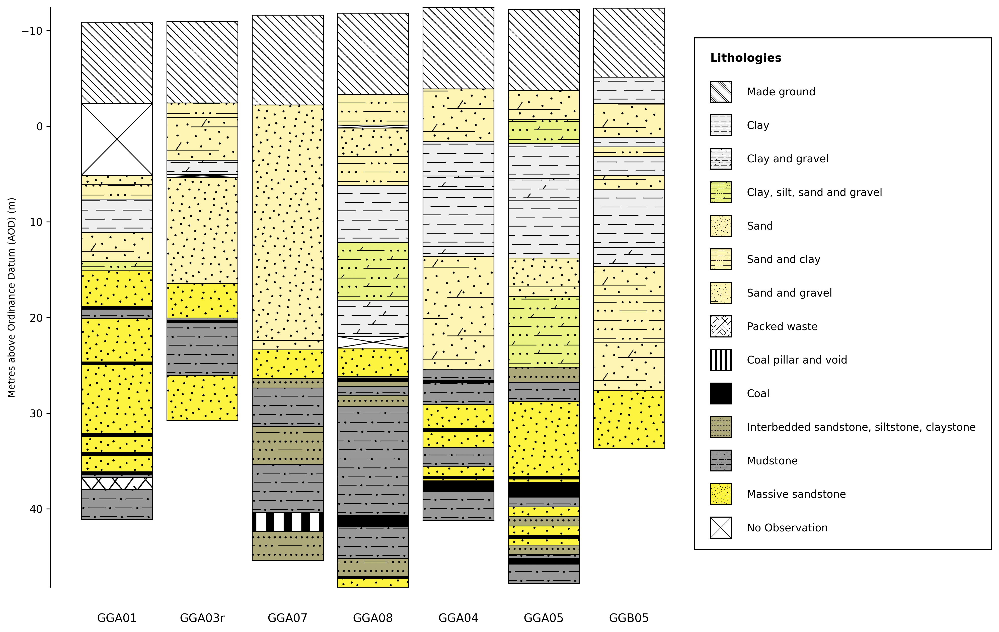

In [20]:
# Use the correlated_logs function to create the panel of logs automatically, with custom arguments for formatting and appearance
panel = sp.correlated_logs(files, figsize=(10, 10), left_y_axis=True, dpi=300, y_label='Metres above Ordinance Datum (AOD)')

# Add a title and labels for each log
for i, ax in enumerate(panel.axes):
    ax.set_xlabel(log_names[i], fontsize=11)

# panel.save('Figure8.png', transparent=True)

### References

1. N. Papadimitriou, R. Deschamps, V. Symeou, C. Souque, C. Gorini, F. H. Nader, C. Blanpied. The tectonostratigraphic evolution of Cenozoic basins of the Northern Tethys: The Northern margin of the Levant Basin. **Oil Gas Sci. Technol. 73** 77 (2018) [DOI](https://doi.org/10.2516/ogst/2018085)

2. R. N. Palamakumbura, A. H. F. Robertson. Pliocene-Pleistocene sedimentary-tectonic development of the Mesaoria (Mesarya) Basin in an incipient, diachronous collisional setting: facies evidence from the north of Cyprus. **Geol. Mag. 155** 5 997-1022 (2018) [DOI](https://doi.org/10.1017/s0016756816001072)

3. E. M. Balmer, A. H. F. Robertson, I. Raffi, D. Kroon. Pliocene-Pleistocene sedimentary development of the syntectonic Polis graben, NW Cyprus: evidence from facies analysis, nannofossil biochronology and strontium isotope dating. **Geol. Mag. 156** 5 889-917 (2019) [DOI](https://doi.org/10.1017/s0016756818000286)

4. C. Antoniou, A. H. F. Robertson. Middle-Late Pleistocene to Holocene sediments of the Tremithos River and related shallow-marine to non-marine coastal deposits in SE Cyprus: Products of inter-related surface uplift and glacio-eustatic controlled sea-level change. **Sediment. Geol. 486** 106900 (2025) [DOI](https://doi.org/10.1016/j.sedgeo.2025.106900)

5. R. Tostevin, M. O. Clarkson, S. Gangl, G. A. Shields, R. A. Wood, F. Bowyer, A. M. Penny, C. H. Stirling. Uranium isotope evidence for an expansion of anoxia in terminal Ediacaran oceans. **Earth Planet. Sci. Lett. 506** 104-112 (2019) [DOI](https://doi.org/10.1016/j.epsl.2018.10.045)

6. P. Shane, E. L. Sikes, T. P. Guilderson. Tephra beds in deep-sea cores off northern New Zealand: implications for the history of Taupo Volcanic Zone, Mayor Island and White Island volcanoes. **J. Volcanol. Geotherm. Res. 154** 3 276-290 (2006) [DOI](https://doi.org/10.1016/j.jvolgeores.2006.03.021)

7. British Geological Survey. UK Geoenergy Observatories Data, https://ukgeos.ac.uk/data-downloads